### Transformations of $\mathbb{R}^3$

In [6]:
# Reflection about the mirror plane passing through the origin with normal vector u = (a, b, c).

def refMat3D(u):
    u = vector(u)
    a, b, c = u/norm(u)
    return matrix([[1 - 2*a^2, -2*a*b, -2*a*c], [-2*a*b, 1 - 2*b^2, -2*b*c], [-2*a*c, -2*b*c, 1 - 2*c^2]])

# Rotation about the axis passing through the origin and parallel to the vector u = (a, b, c) with angle theta. The direction of rotation is counterclockwise with respect to u if theta > 0, and clockwise with respect to u if theta < 0.

def rotMat3D(u, theta):
    u = vector(u)
    a, b, c = u/norm(u)
    
    row1 = [a^2*(1 - cos(theta)) + cos(theta), a*b*(1 - cos(theta)) - c*sin(theta), a*c*(1 - cos(theta)) + b*sin(theta)]
    row2 = [a*b*(1 - cos(theta)) + c*sin(theta), b^2*(1 - cos(theta)) + cos(theta), b*c*(1 - cos(theta)) - a*sin(theta)]
    row3 = [a*c*(1 - cos(theta)) - b*sin(theta), b*c*(1 - cos(theta)) + a*sin(theta), c^2*(1 - cos(theta)) + cos(theta)]
    
    return matrix([row1, row2, row3])

# Orthogonal Projection onto the plane passing through the origin with normal vector u = (a, b, c).

def projMat3D(u):
    u = vector(u)
    a, b, c = u/norm(u)
    
    return matrix([[1 - a^2, -a*b, -a*c], [-a*b, 1 - b^2, - b*c], [-a*c, -b*c, 1 - c^2]])

#Contraction (resp. Dilation) with contraction (resp. dilation) factor 0 <= c < 1 (resp. c > 1)

def conDilMat3D(c):
    return matrix([[c, 0, 0], [0, c, 0], [0, 0, c]])

# Compression (resp. Expansion) in x-direction with compression (resp. expansion) factor 0 <= c < 1 (resp. c > 1)

def compExpXMat3D(c):
    return matrix([[c, 0, 0], [0, 1, 0], [0, 0, 1]])

# Shear/Slanting in the x-direction with shearing factors c and d

def shearXMat3D(c, d):
    return matrix([[1, 0, 0], [c, 1, 0], [d, 0, 1]])

In [7]:
# Illustration No. 1

from sage.plot.colors import *

def v(s, t):
    x = (2 + sin(7*s + 5*t))*cos(s)*sin(t)
    y = (2 + sin(7*s + 5*t))*sin(s)*sin(t)
    z = (2 + sin(7*s + 5*t))*cos(t)

    return vector((x, y, z))

s, t = var('s t')
surface = parametric_plot3d(v(s, t), (s, 0, pi), (t, 0, 2*pi ), color = red, plot_points = 200, alpha = 1.0)

surface.show(aspect_ratio = 1, frame = false)

Graphics3d Object

Animation with 5 frames
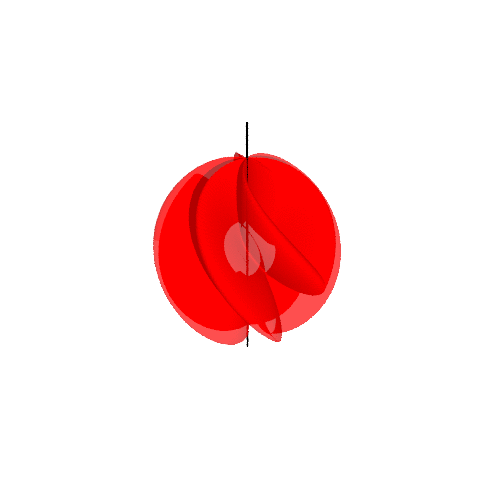

In [8]:
# Illustration No. 2

from sage.plot.colors import *

def v(s, t):
    x = (2 + sin(7*s + 5*t))*cos(s)*sin(t)
    y = (2 + sin(7*s + 5*t))*sin(s)*sin(t)
    z = (2 + sin(7*s + 5*t))*cos(t)

    return vector((x, y, z))

s, t = var('s t')
axis = line([(0, 0, -4), (0, 0, 4)], thickness = 2, color = black)
frames = [axis + parametric_plot3d(rotMat3D([0, 0, 1], theta)*v(s, t), (s, 0, pi), (t, 0, 2*pi), color = red, plot_points = 200, alpha = 0.8 ) for theta in sxrange(0, 2*pi, 2*pi/5)]

rotatingSurface = animate(frames, aspect_ratio = 1, frame = false)
rotatingSurface.show()

In [9]:
# Illustration No. 3

from sage.plot.colors import *

def v(s, t):
    x = (2 + sin(7*s + 5*t))*cos(s)*sin(t)
    y = (2 + sin(7*s + 5*t))*sin(s)*sin(t)
    z = (2 + sin(7*s + 5*t))*cos(t)

    return vector((x, y, z))

s, t = var('s t')
origSurface = parametric_plot3d(v(s, t), (s, 0, pi), (t, 0, 2*pi ), color = red, plot_points = 150, alpha = 1.0)
transSurface = parametric_plot3d(refMat3D([0, 0, 1])*v(s, t), (s, 0, pi), (t, 0, 2*pi ), color = yellow, plot_points = 200, alpha = 1.0)
mirrorPlane = polygon([(4, 4, 0), (-4, 4, 0), (-4, -4, 0), (4, -4, 0)], color = blue, alpha = 0.5)

surfaces = origSurface + transSurface + mirrorPlane
surfaces.show(aspect_ratio = 1, frame = false)

Graphics3d Object

In [29]:
# Illustration No. 4

from sage.plot.colors import *

def v(t):
    x = cos(t)*sin(2*arctan(exp(-t/8)))
    y = sin(t)*sin(2*arctan(exp(-t/8)))
    z = cos(2*arctan(exp(-t/8)))

    return vector((x, y, z))

s, t = var('s t')
surface = parametric_plot3d(v(t), (t, -10*pi, 10*pi ), thickness = 3, color = blue.darker(0.5), plot_points = 500, alpha = 1.0)

surface.show(aspect_ratio = 1, frame = false)

Graphics3d Object

In [36]:
# Illustration No. 5

from sage.plot.colors import *

def v(t):
    x = cos(t)*sin(2*arctan(exp(-t/8)))
    y = sin(t)*sin(2*arctan(exp(-t/8)))
    z = cos(2*arctan(exp(-t/8)))

    return vector((x, y, z))

s, t = var('s t')
origSurface = parametric_plot3d(v(t), (t, -10*pi, 10*pi ), thickness = 3, color = blue.darker(0.5), plot_points = 500, alpha = 1.0)
transSurface = parametric_plot3d(projMat3D([0, 0, 1])*v(t), (t, -10*pi, 10*pi ), thickness = 2, color = blue.darker(0.5), plot_points = 500, alpha = 1.0)

transSurface.show(aspect_ratio = 1, frame = false)

Graphics3d Object

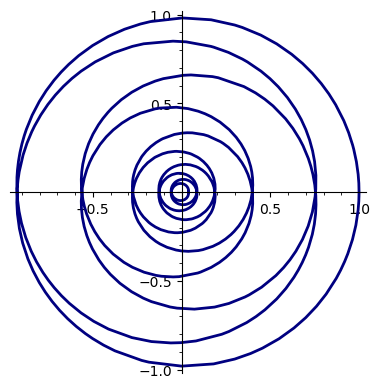

In [35]:
# Illustration No. 6

from sage.plot.colors import *

def v(t):
    x = cos(t)*sin(2*arctan(exp(-t/8)))
    y = sin(t)*sin(2*arctan(exp(-t/8)))
    z = cos(2*arctan(exp(-t/8)))

    return vector((x, y, z))

s, t = var('s t')
origSurface = parametric_plot3d(v(t), (t, -10*pi, 10*pi ), thickness = 3, color = blue.darker(0.5), plot_points = 500, alpha = 1.0)
transSurface = parametric_plot((projMat3D([0, 0, 1])*v(t))[:-1], (t, -10*pi, 10*pi ), thickness = 2, color = blue.darker(0.5), plot_points = 500, alpha = 1.0)

transSurface.show(aspect_ratio = 1, frame = false)

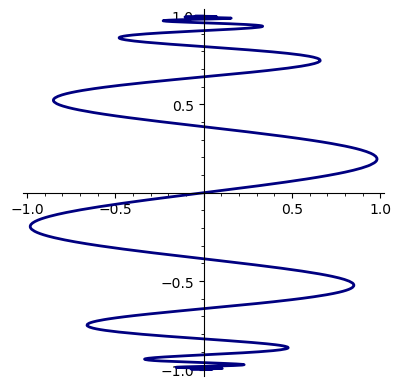

In [37]:
# Illustration No. 7

from sage.plot.colors import *

def v(t):
    x = cos(t)*sin(2*arctan(exp(-t/8)))
    y = sin(t)*sin(2*arctan(exp(-t/8)))
    z = cos(2*arctan(exp(-t/8)))

    return vector((x, y, z))

s, t = var('s t')
origSurface = parametric_plot3d(v(t), (t, -10*pi, 10*pi ), thickness = 3, color = blue.darker(0.5), plot_points = 500, alpha = 1.0)
transSurface = parametric_plot((projMat3D([1, 0, 0])*v(t))[1:], (t, -10*pi, 10*pi ), thickness = 2, color = blue.darker(0.5), plot_points = 500, alpha = 1.0)

transSurface.show(aspect_ratio = 1, frame = false)

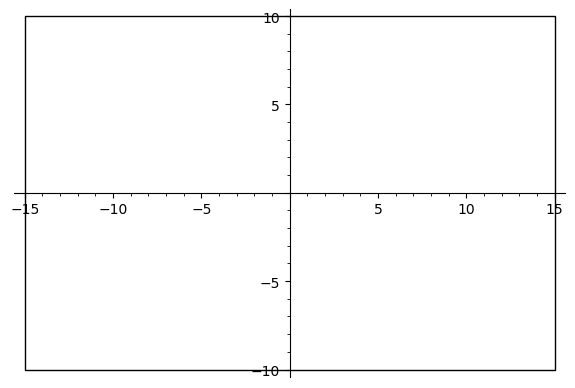

In [3]:
from sage.plot.colors import *
container = polygon([[15, 10], [-15, 10], [-15, -10], [15, -10]], color = white, edgecolor = black)
container